# Extract Origami Pattern

Transfer the reference image pattern into the white area of the mask.

In [1]:
from IPython.display import Image as DisplayImage, display

from origami_texturing import extract_origami_pattern
from origami_texturing import paths
from origami_texturing.paths import ensure_project_dirs

ensure_project_dirs()

## Paths

In [2]:
mask_path = paths.RAW_DATA_DIR / "mask.png"
reference_path = paths.INPUTS_DIR / "reference.png"

output_path = paths.OUTPUT_DIR / "generated.png"

input_paths = {
    "mask": mask_path,
    "reference": reference_path,
}

for name, path in input_paths.items():
    print(f"{name}: {path} | exists={path.is_file()}")

print(f"output: {output_path}")

mask: C:\Users\morph\GitHub\origami-texturing\data\raw\mask.png | exists=True
reference: C:\Users\morph\GitHub\origami-texturing\inputs\reference.png | exists=True
output: C:\Users\morph\GitHub\origami-texturing\outputs\generated.png


In [3]:
missing = [name for name, path in input_paths.items() if not path.is_file()]
if missing:
    raise FileNotFoundError(f"Missing input files: {', '.join(missing)}")

## Preview Inputs

mask


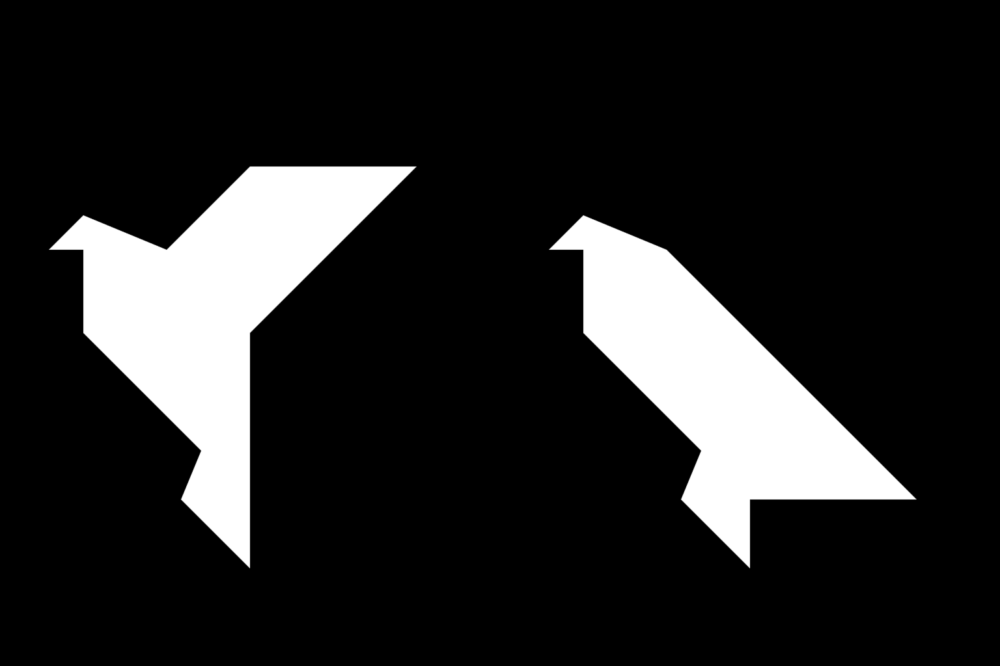

reference


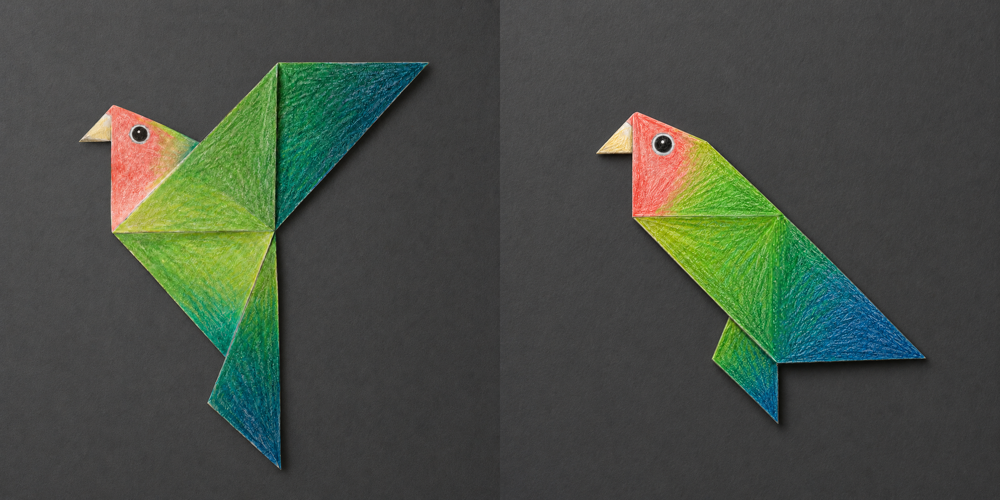

In [4]:
for name, path in input_paths.items():
    print(name)
    display(DisplayImage(filename=str(path), height=512))

## Generate

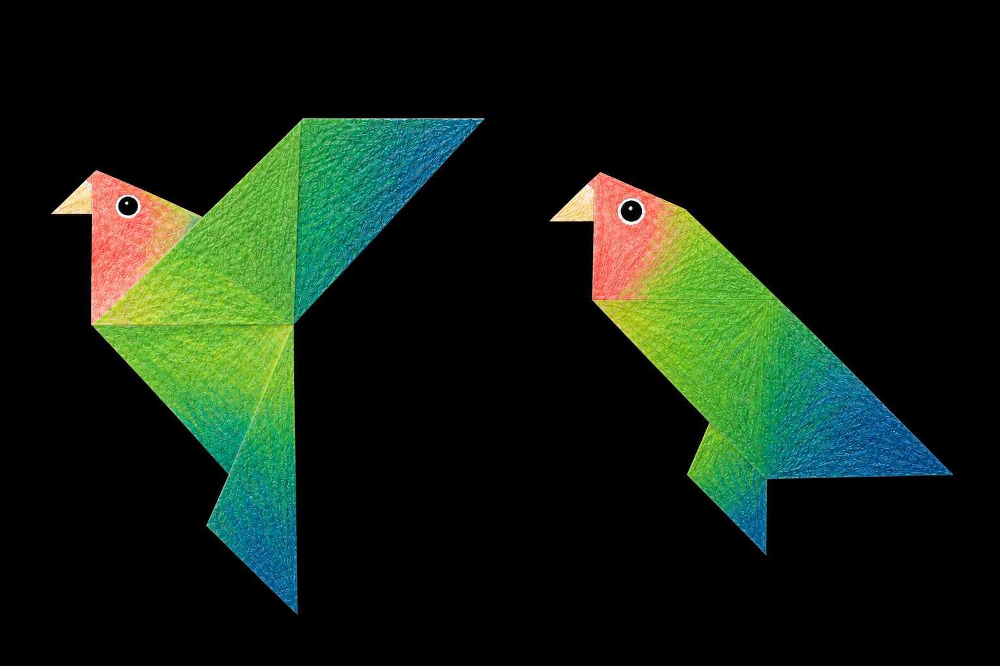

WindowsPath('C:/Users/morph/GitHub/origami-texturing/outputs/generated.png')

In [5]:
generated_path = extract_origami_pattern(
    mask_path=mask_path,
    reference_path=reference_path,
    output_path=output_path,
)

display(DisplayImage(filename=str(generated_path), height=512))
generated_path

## Remove Background

c:\Users\morph\GitHub\origami-texturing\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


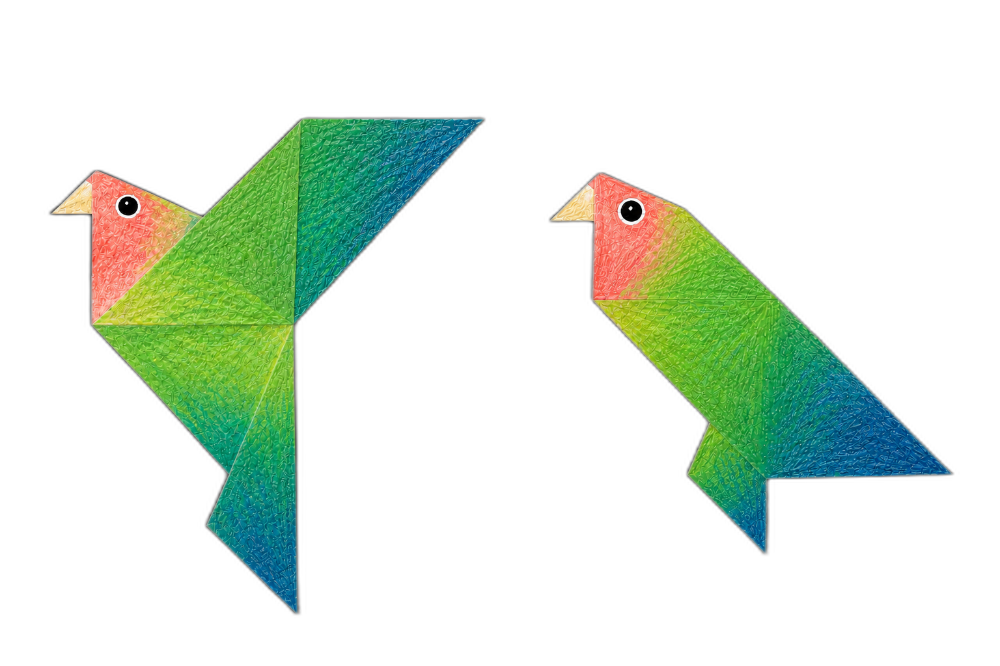

WindowsPath('C:/Users/morph/GitHub/origami-texturing/outputs/generated_transparent.png')

In [6]:
from io import BytesIO

from PIL import Image
from rembg import remove

transparent_path = paths.OUTPUT_DIR / f"{generated_path.stem}_transparent.png"

with generated_path.open("rb") as input_file:
    transparent_bytes = remove(input_file.read())

transparent_image = Image.open(BytesIO(transparent_bytes)).convert("RGBA")
transparent_image.save(transparent_path)

display(DisplayImage(filename=str(transparent_path), height=512))
transparent_path